<a href="https://colab.research.google.com/github/DiabeticRetinopathy114/114_DR/blob/main/224x224%20Gaussian%20Filtered/Gaussian/gaussian.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
# IMPORTANT: SOME KAGGLE DATA SOURCES ARE PRIVATE
# RUN THIS CELL IN ORDER TO IMPORT YOUR KAGGLE DATA SOURCES.
import kagglehub
kagglehub.login()


In [ ]:
# IMPORTANT: RUN THIS CELL IN ORDER TO IMPORT YOUR KAGGLE DATA SOURCES,
# THEN FEEL FREE TO DELETE THIS CELL.
# NOTE: THIS NOTEBOOK ENVIRONMENT DIFFERS FROM KAGGLE'S PYTHON
# ENVIRONMENT SO THERE MAY BE MISSING LIBRARIES USED BY YOUR
# NOTEBOOK.

aptos2019_blindness_detection_path = kagglehub.competition_download('aptos2019-blindness-detection')

print('Data source import complete.')


In [ ]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All"
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/aptos2019-blindness-detection/sample_submission.csv
/kaggle/input/aptos2019-blindness-detection/train.csv
/kaggle/input/aptos2019-blindness-detection/test.csv
/kaggle/input/aptos2019-blindness-detection/train_images/ef476be214d4.png
/kaggle/input/aptos2019-blindness-detection/train_images/6dcde47060f9.png
/kaggle/input/aptos2019-blindness-detection/train_images/ec363f48867b.png
/kaggle/input/aptos2019-blindness-detection/train_images/17f6c7072f61.png
/kaggle/input/aptos2019-blindness-detection/train_images/b49b2fac2514.png
/kaggle/input/aptos2019-blindness-detection/train_images/af6166d57f13.png
/kaggle/input/aptos2019-blindness-detection/train_images/8d13c46e7d75.png
/kaggle/input/aptos2019-blindness-detection/train_images/c3b15bf9b4bc.png
/kaggle/input/aptos2019-blindness-detection/train_images/be68322c7223.png
/kaggle/input/aptos2019-blindness-detection/train_images/88e4399d207c.png
/kaggle/input/aptos2019-blindness-detection/train_images/0243404e8a00.png
/kaggle/input

In [ ]:
import pandas as pd
import cv2
import os

from tqdm.notebook import tqdm

In [ ]:
file = pd.read_csv('/kaggle/input/aptos2019-blindness-detection/train.csv')

In [ ]:
file.head()

,id_code,diagnosis
0,000c1434d8d7,2
1,001639a390f0,4
2,0024cdab0c1e,1
3,002c21358ce6,0
4,005b95c28852,0


In [ ]:
no_dr = 'No_DR/'
mild = 'Mild/'
moderate = 'Moderate/'
severe = 'Severe/'
proliferate_dr = 'Proliferate_DR/'

In [ ]:
train_y = file['diagnosis']
print(train_y.head())
# get the number of images per category
num_img_by_cat = (train_y.value_counts())
print(num_img_by_cat, type(num_img_by_cat))

0    2
1    4
2    1
3    0
4    0
Name: diagnosis, dtype: int64
diagnosis
0    1805
2     999
1     370
4     295
3     193
Name: count, dtype: int64 <class 'pandas.core.series.Series'>


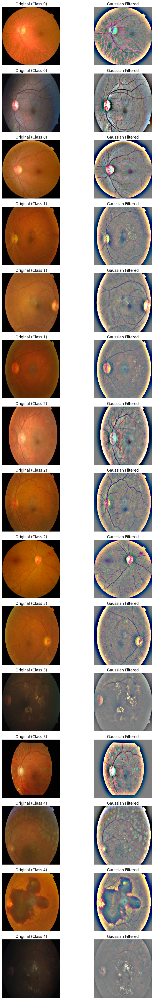

In [ ]:
import cv2
import matplotlib.pyplot as plt
import pandas as pd
import random

sigmaX = 10

# 隨機從每個 diagnosis 類別選幾張圖片 (例如每類選3張)
num_samples_per_class = 3

# 設定圖檔路徑
image_dir = '/kaggle/input/aptos2019-blindness-detection/train_images/'

# 總資料表 (假設你已經有 file DataFrame)
# file = pd.read_csv('/kaggle/input/aptos2019-blindness-detection/train.csv')

def display_gaussian_samples(file, num_samples_per_class=3):
    selected_rows = []

    # 每個 diagnosis 類別隨機抽 num_samples_per_class 張
    for class_id in sorted(file['diagnosis'].unique()):
        samples = file[file['diagnosis'] == class_id].sample(num_samples_per_class, random_state=42)
        selected_rows.extend(samples.to_dict('records'))

    # 計算要畫的行數與欄數（每張圖顯示兩張圖：原圖+高斯）
    num_rows = len(selected_rows)
    plt.figure(figsize=(10, num_rows * 3))

    for idx, row in enumerate(selected_rows):
        id_code = row['id_code']
        read_path = image_dir + id_code + '.png'
        image = cv2.imread(read_path)

        if image is None:
            print(f"Failed to load image: {read_path}")
            continue

        # Resize 成 224x224
        image = cv2.resize(image, (224, 224))

        # 轉成 RGB 格式
        image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

        # 套用高斯模糊與加權
        gaussian = cv2.addWeighted(image, 4, cv2.GaussianBlur(image, (0,0), sigmaX), -4, 128)
        gaussian_rgb = cv2.cvtColor(gaussian, cv2.COLOR_BGR2RGB)

        # 畫原圖
        plt.subplot(num_rows, 2, idx*2 + 1)
        plt.imshow(image_rgb)
        plt.title(f'Original (Class {row["diagnosis"]})')
        plt.axis('off')

        # 畫高斯濾波圖
        plt.subplot(num_rows, 2, idx*2 + 2)
        plt.imshow(gaussian_rgb)
        plt.title('Gaussian Filtered')
        plt.axis('off')

    plt.tight_layout()
    plt.show()

# 呼叫函式
display_gaussian_samples(file, num_samples_per_class=3)


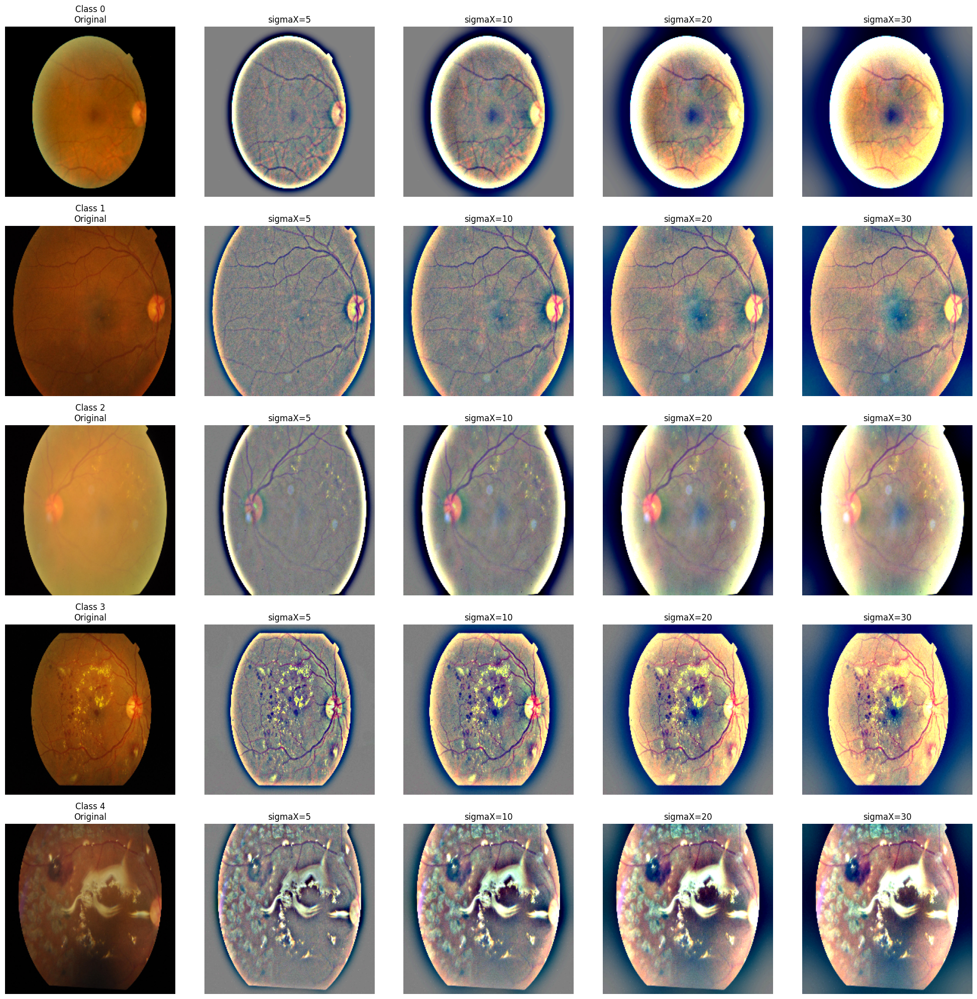

In [ ]:


# 讀取標註檔案
file = pd.read_csv('/kaggle/input/aptos2019-blindness-detection/train.csv')
image_dir = '/kaggle/input/aptos2019-blindness-detection/train_images/'

# sigmaX 要測試的數值
sigmaX_values = [5, 10, 20, 30]

# 準備資料：每個 diagnosis 隨機取一張
selected_rows = []
for class_id in sorted(file['diagnosis'].unique()):
    sample_row = file[file['diagnosis'] == class_id].sample(1).iloc[0]
    selected_rows.append(sample_row)

# 繪圖設定
num_rows = len(selected_rows)
num_cols = len(sigmaX_values) + 1  # Original + sigmaX 效果圖
plt.figure(figsize=(num_cols * 4, num_rows * 4))

for row_idx, row in enumerate(selected_rows):
    id_code = row['id_code']
    diagnosis = row['diagnosis']
    read_path = image_dir + id_code + '.png'

    image = cv2.imread(read_path)
    if image is None:
        print(f"Failed to load image: {read_path}")
        continue

    # Resize 成 224x224
    image = cv2.resize(image, (224, 224))
    image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

    # 畫 Original
    plt_idx = row_idx * num_cols + 1
    plt.subplot(num_rows, num_cols, plt_idx)
    plt.imshow(image_rgb)
    plt.title(f'Class {diagnosis}\nOriginal')
    plt.axis('off')

    # 畫不同 sigmaX 效果
    for sigma_idx, sigmaX in enumerate(sigmaX_values):
        gaussian = cv2.addWeighted(image, 4, cv2.GaussianBlur(image, (0,0), sigmaX), -4, 128)
        gaussian_rgb = cv2.cvtColor(gaussian, cv2.COLOR_BGR2RGB)

        plt_idx = row_idx * num_cols + sigma_idx + 2
        plt.subplot(num_rows, num_cols, plt_idx)
        plt.imshow(gaussian_rgb)
        plt.title(f'sigmaX={sigmaX}')
        plt.axis('off')

plt.tight_layout()
plt.show()


In [ ]:
import os
import cv2
import pandas as pd
from tqdm import tqdm

# 分類資料夾名稱
no_dr = 'No_DR/'
mild = 'Mild/'
moderate = 'Moderate/'
severe = 'Severe/'
proliferate_dr = 'Proliferate_DR/'

# 輸出資料夾根目錄（只能寫到 /kaggle/working/ 下）
output_root = '/kaggle/working/gaussian_filtered_images/'

# 讀取標註檔案
file = pd.read_csv('/kaggle/input/aptos2019-blindness-detection/train.csv')
train_y = file['diagnosis']

# 確認每個類別的圖片數量
num_img_by_cat = train_y.value_counts()

# 建立類別子資料夾
category_folders = [no_dr, mild, moderate, severe, proliferate_dr]
for folder in category_folders:
    os.makedirs(os.path.join(output_root, folder), exist_ok=True)

sigmaX = 10

# 依據每個 class_id 分類進行處理
for class_id in tqdm(sorted(train_y.unique()), desc="Processing Classes"):
    class_name = category_folders[class_id]  # 對應的子資料夾名稱
    class_samples = file.loc[file['diagnosis'] == class_id].sample(num_img_by_cat[class_id])

    for idx, row in tqdm(class_samples.iterrows(), total=len(class_samples), desc=f"Class {class_id}"):
        read_path = '/kaggle/input/aptos2019-blindness-detection/train_images/' + row['id_code'] + '.png'
        write_path = os.path.join(output_root, class_name, row['id_code'] + '.png')

        image = cv2.imread(read_path)
        if image is None:
            print(f"Failed to load image: {read_path}")
            continue

        # 套用 Gaussian Filter
        gaussian = cv2.addWeighted(image, 4, cv2.GaussianBlur(image, (0,0), sigmaX), -4, 128)
        gaussian = cv2.resize(gaussian, (224, 224))

        # 儲存處理後的圖片
        cv2.imwrite(write_path, gaussian)


Processing Classes: 100%|██████████| 5/5 [12:37<00:00, 151.46s/it]


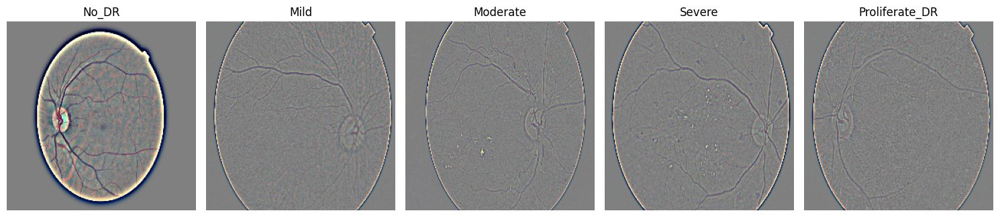

In [ ]:
import matplotlib.pyplot as plt
import random

# 顯示每個類別資料夾隨機一張處理後的圖片
plt.figure(figsize=(15, 8))

for i, folder in enumerate(category_folders):
    folder_path = os.path.join(output_root, folder)
    image_files = os.listdir(folder_path)

    if not image_files:
        print(f"No images found in {folder_path}")
        continue

    random_file = random.choice(image_files)
    image_path = os.path.join(folder_path, random_file)

    image = cv2.imread(image_path)
    image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

    plt.subplot(1, len(category_folders), i+1)
    plt.imshow(image_rgb)
    plt.title(folder.strip('/'))
    plt.axis('off')

plt.tight_layout()
plt.show()


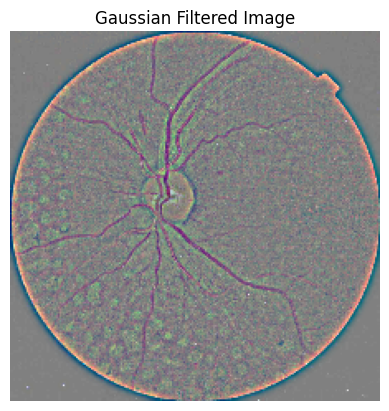

In [ ]:
import cv2
import matplotlib.pyplot as plt

# 讀取圖片
image = cv2.imread(image_path)

# 確保圖片有正確讀取
if image is None:
    print(f"Failed to load image: {image_path}")
else:
    # 套用 Gaussian Filter
    sigmaX = 10
    gaussian = cv2.addWeighted(image, 4, cv2.GaussianBlur(image, (0,0), sigmaX), -4, 128)
    gaussian = cv2.resize(gaussian, (224, 224))

    # 轉換 BGR → RGB
    image_rgb = cv2.cvtColor(gaussian, cv2.COLOR_BGR2RGB)

    # 顯示圖片
    plt.imshow(image_rgb)
    plt.axis('off')
    plt.title('Gaussian Filtered Image')
    plt.show()


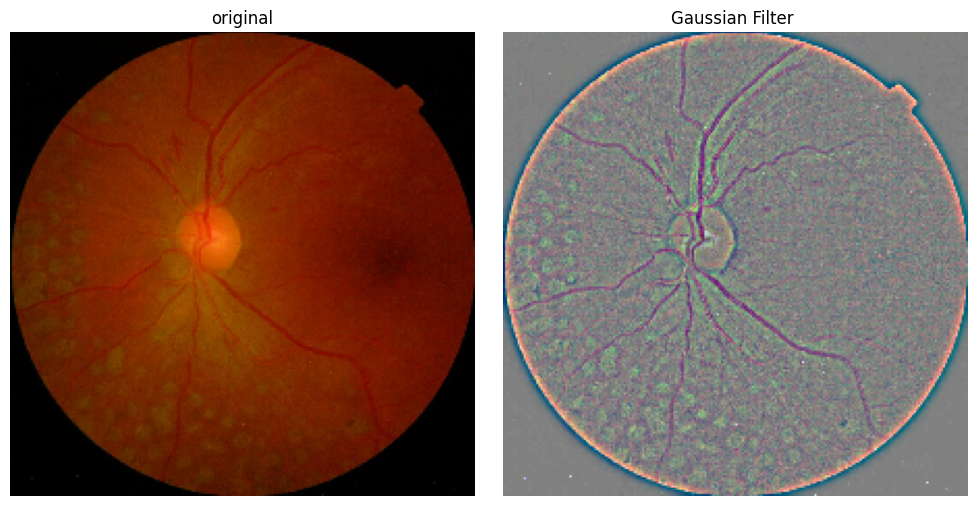

In [ ]:
import cv2
import matplotlib.pyplot as plt

# 讀取圖片
image = cv2.imread(image_path)

# 確保圖片有正確讀取
if image is None:
    print(f"Failed to load image: {image_path}")
else:
    # 套用 Gaussian Filter
    sigmaX = 10
    gaussian = cv2.addWeighted(image, 4, cv2.GaussianBlur(image, (0,0), sigmaX), -4, 128)
    gaussian = cv2.resize(gaussian, (224, 224))

    # 原圖大小也調整成相同尺寸方便比較
    original_resized = cv2.resize(image, (224, 224))

    # BGR 轉 RGB
    original_rgb = cv2.cvtColor(original_resized, cv2.COLOR_BGR2RGB)
    gaussian_rgb = cv2.cvtColor(gaussian, cv2.COLOR_BGR2RGB)

    # 建立左右兩張圖的 subplot
    fig, axes = plt.subplots(1, 2, figsize=(10, 5))

    # 左圖：原圖
    axes[0].imshow(original_rgb)
    axes[0].axis('off')
    axes[0].set_title('original')

    # 右圖：Gaussian Filter 後
    axes[1].imshow(gaussian_rgb)
    axes[1].axis('off')
    axes[1].set_title('Gaussian Filter ')

    plt.tight_layout()
    plt.show()


class: 0 ( 1805 )


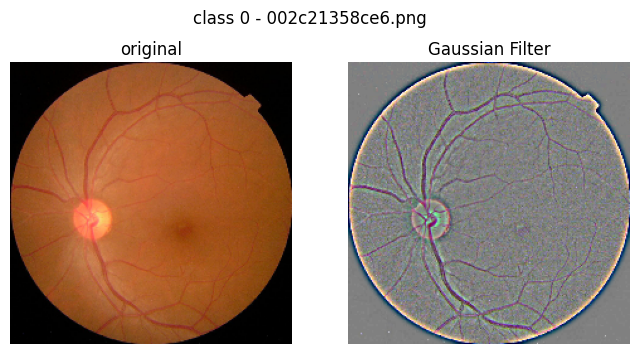

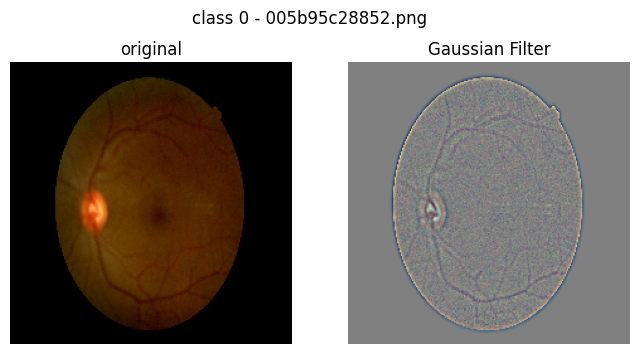

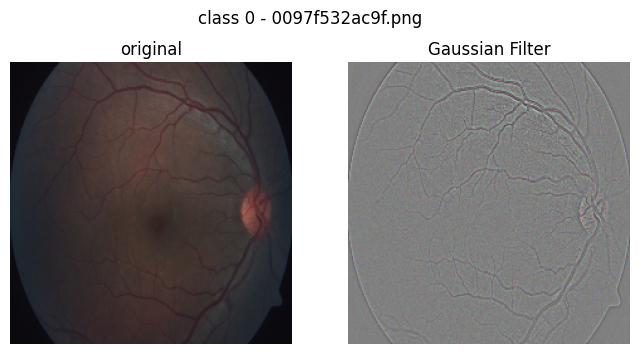

class: 1 ( 370 )


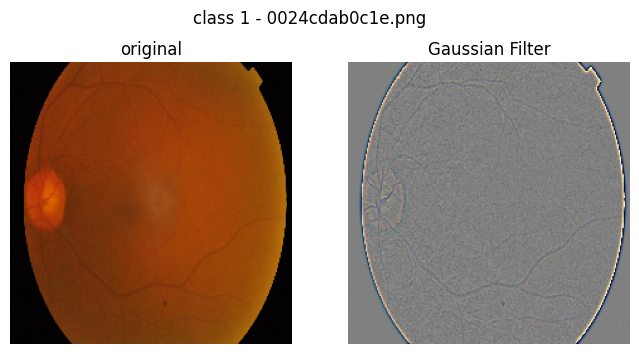

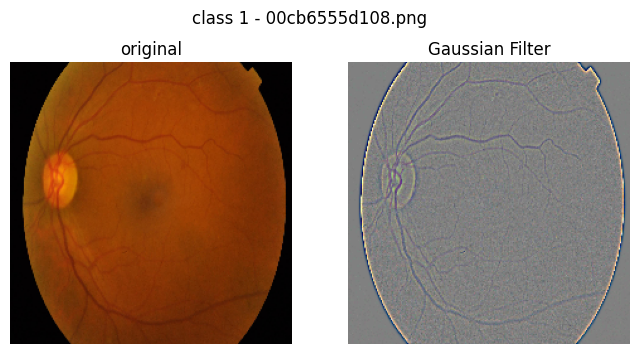

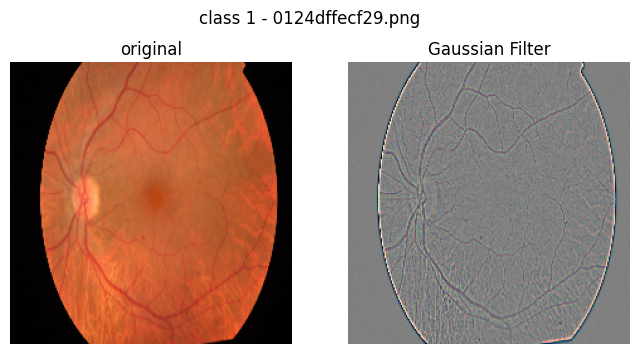

class: 2 ( 999 )


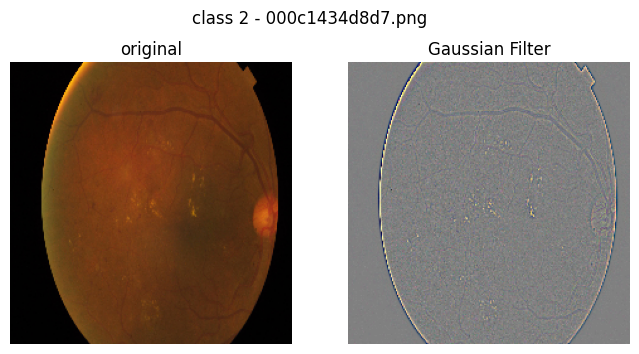

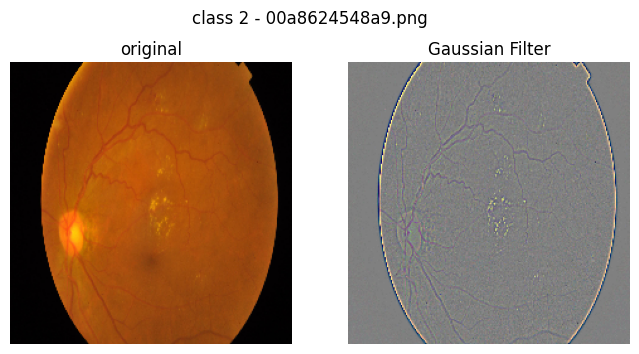

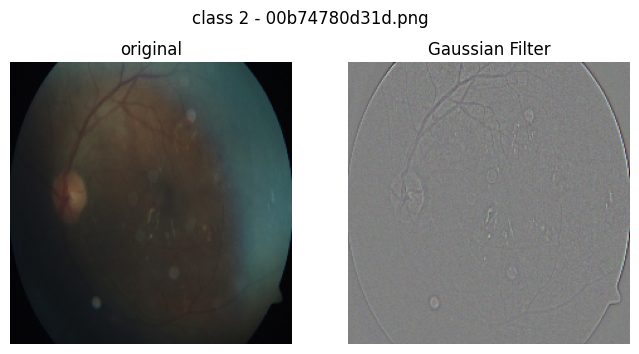

class: 3 ( 193 )


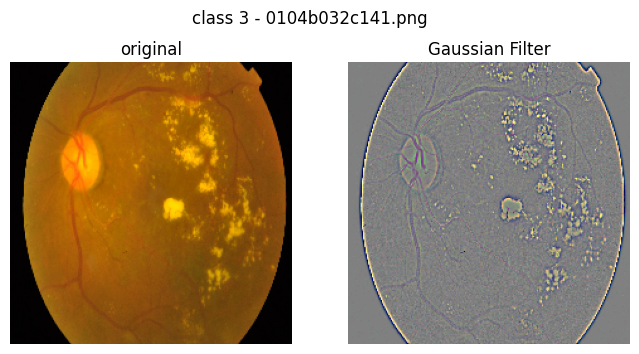

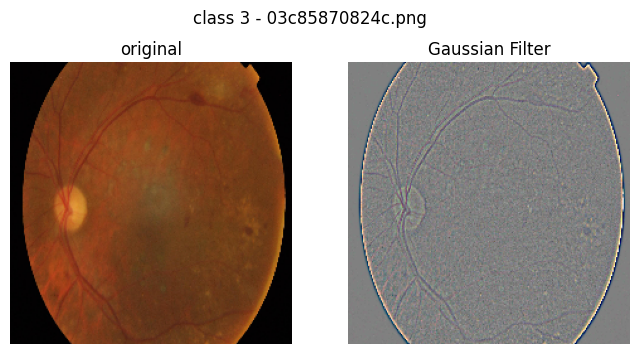

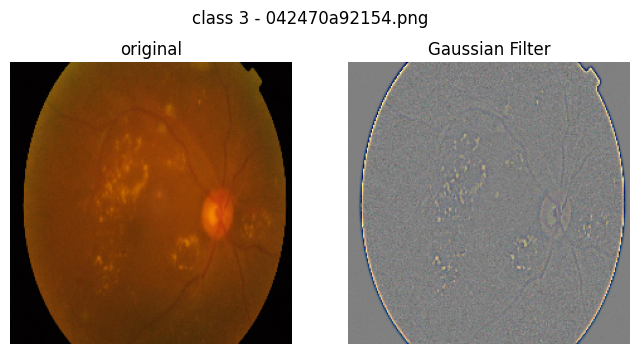

class: 4 ( 295 )


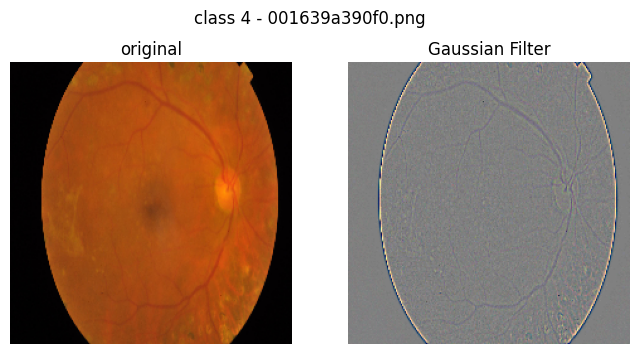

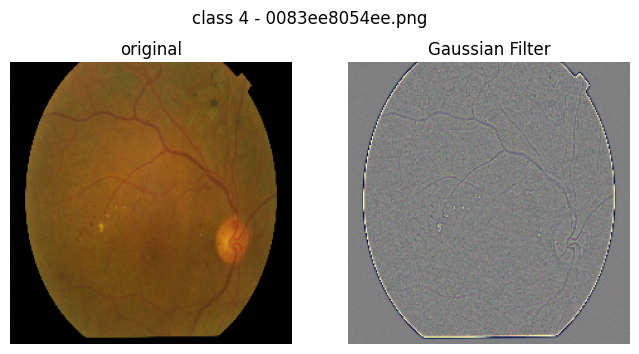

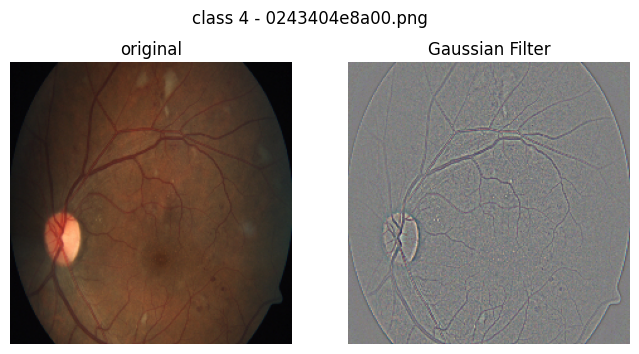

In [ ]:
import os
import cv2
import pandas as pd
import matplotlib.pyplot as plt

# 路徑設定
image_dir = '/kaggle/input/aptos2019-blindness-detection/train_images/'
csv_path = '/kaggle/input/aptos2019-blindness-detection/train.csv'

# 讀CSV
df = pd.read_csv(csv_path)

sigmaX = 10
resize_size = (224, 224)

# 對每個類別分組
for diagnosis, group in df.groupby('diagnosis'):
    print(f'class: {diagnosis} ( {len(group)} )')

    # 只示範該類別前3張圖，避免顯示太多
    for idx, row in group.head(3).iterrows():
        image_name = row['id_code'] + '.png'
        image_path = os.path.join(image_dir, image_name)

        image = cv2.imread(image_path)
        if image is None:
            print(f"Failed to load image: {image_path}")
            continue

        # Gaussian Filter
        gaussian = cv2.addWeighted(image, 4, cv2.GaussianBlur(image, (0,0), sigmaX), -4, 128)
        gaussian = cv2.resize(gaussian, resize_size)

        # 原圖 resize
        original_resized = cv2.resize(image, resize_size)

        # BGR轉RGB
        original_rgb = cv2.cvtColor(original_resized, cv2.COLOR_BGR2RGB)
        gaussian_rgb = cv2.cvtColor(gaussian, cv2.COLOR_BGR2RGB)

        # 顯示左右對比
        fig, axes = plt.subplots(1, 2, figsize=(8, 4))
        axes[0].imshow(original_rgb)
        axes[0].axis('off')
        axes[0].set_title('original')
        axes[1].imshow(gaussian_rgb)
        axes[1].axis('off')
        axes[1].set_title('Gaussian Filter')
        plt.suptitle(f'class {diagnosis} - {image_name}')
        plt.show()
